## Preparing the Enviroment

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

## The Data URL

In [2]:
_URL = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"

## Extract the Data Folder

In [3]:
zip_dir = tf.keras.utils.get_file('flower_photos.tgz', origin=_URL, extract=True)

228813984/228813984 [==============================] - 5s 0us/step


## Converting the Data from RGB to Gray to reduce the Dimensions

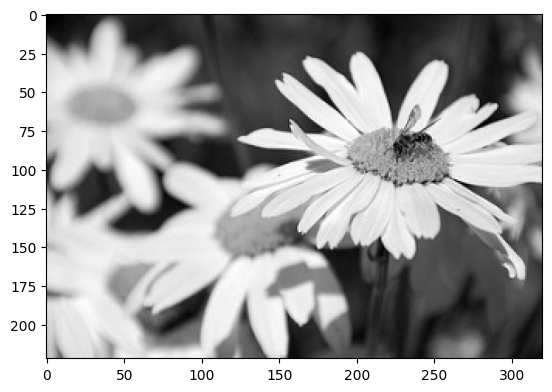

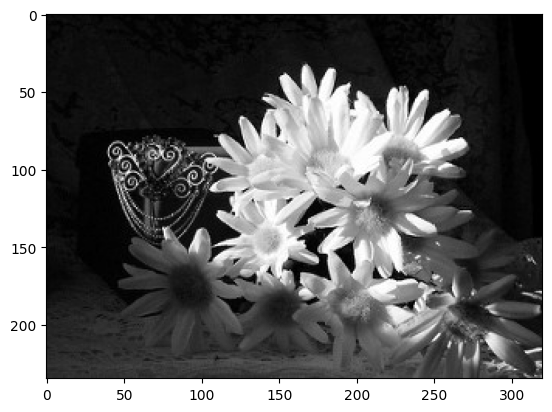

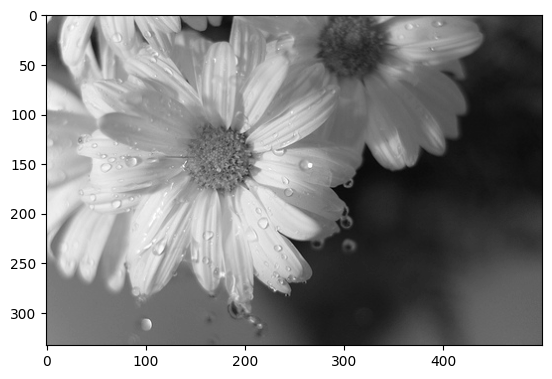

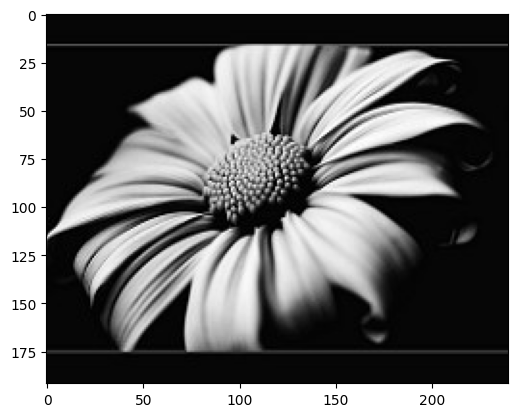

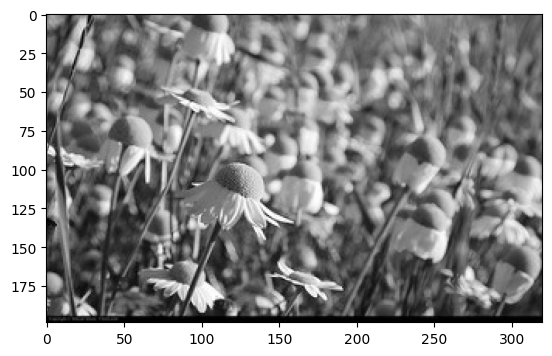

...

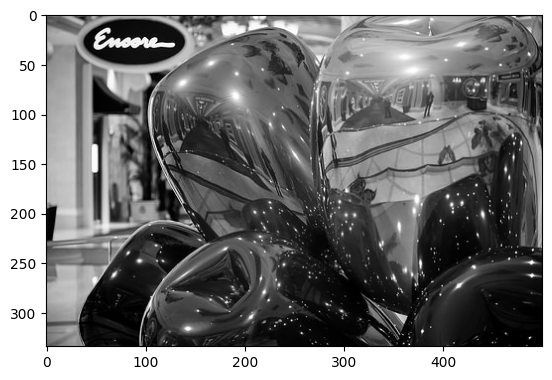

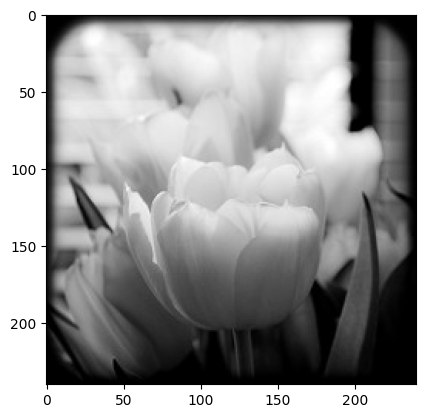

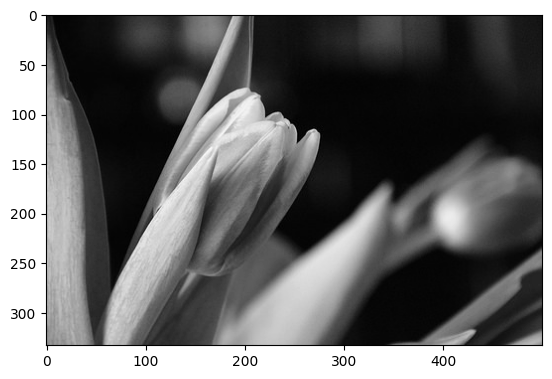

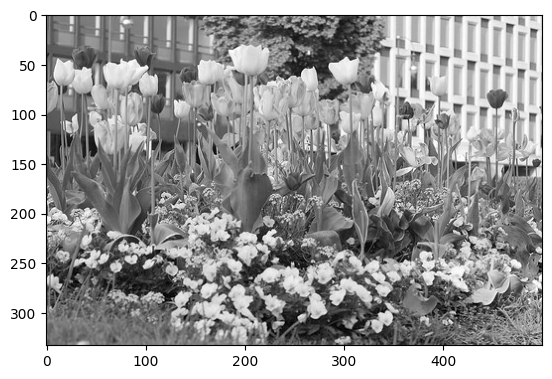

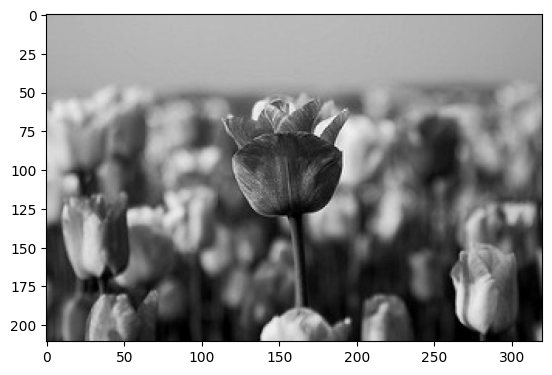

In [4]:
my_dir = os.path.join(os.path.dirname(zip_dir),'flower_photos')
categories = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']
for category in categories:
  path = os.path.join(my_dir, category)
  x = 0
  for img in os.listdir(path):
    x+=1
    img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
    plt.imshow(img_array, cmap='gray')
    plt.show()
    if x == 10:
      break

In [5]:
print(img_array)
print(img_array.shape)

[[179 178 178 ... 163 164 165]
 [178 178 178 ... 163 164 165]
 [178 178 177 ... 164 164 165]
 ...
 [ 45  50  53 ... 132 153 167]
 [ 41  46  49 ... 129 153 169]
 [ 37  42  44 ... 127 153 170]]
(211, 320)


## Set the Image Size to 200*200

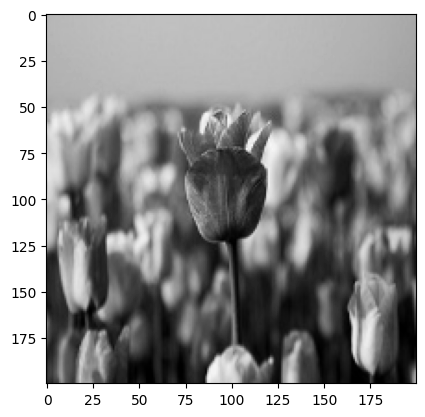

In [6]:
IMG_size = 200
new_array = cv2.resize(img_array, (IMG_size,IMG_size))
plt.imshow(new_array, cmap='gray')
plt.show()

## Make a function to creating the training data

In [7]:
training_data = []
def creating_training_data():
  for category in categories:
    path = os.path.join(my_dir, category)
    class_num = categories.index(category)

    for img in os.listdir(path):
      try:
        img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
        new_array = cv2.resize(img_array,(IMG_size,IMG_size))
        training_data.append([new_array,class_num])
      except:
        pass

creating_training_data()

In [8]:
import random

## Shuffleing the training data to make sure I have the all data classes

In [9]:
random.shuffle(training_data)
for sample in training_data[:5]:
  print(sample)


[array([[91, 92, 92, ..., 97, 98, 96],
       [91, 92, 92, ..., 97, 98, 96],
       [91, 92, 92, ..., 97, 98, 96],
       ...,
       [73, 74, 75, ..., 95, 94, 95],
       [73, 74, 74, ..., 95, 94, 94],
       [73, 74, 74, ..., 94, 95, 94]], dtype=uint8), 1]
[array([[119, 119, 119, ..., 100, 104,  95],
       [121, 121, 120, ..., 102, 129,  95],
       [120, 119, 119, ..., 111, 103,  95],
       ...,
       [131, 113, 125, ..., 118,  92,  88],
       [113, 132, 130, ..., 103,  87,  84],
       [119, 135, 148, ...,  88,  85,  81]], dtype=uint8), 4]
[array([[161, 159, 161, ..., 193, 175, 166],
       [163, 161, 160, ..., 154, 140, 140],
       [161, 161, 160, ..., 165, 137, 119],
       ...,
       [100, 100, 100, ..., 127, 127, 127],
       [100, 100, 100, ..., 127, 127, 126],
       [ 99,  99, 100, ..., 127, 127, 127]], dtype=uint8), 0]
[array([[41, 66, 84, ..., 80, 87, 71],
       [41, 68, 85, ..., 80, 79, 58],
       [42, 70, 84, ..., 87, 89, 65],
       ...,
       [49, 47, 46, ...,

## Separating the data to flowers and it's type

In [10]:
x = []
y = []
for flower,typ in training_data:
  x.append(flower)
  y.append(typ)

x = np.array(x).reshape(-1,IMG_size,IMG_size)
y = np.array(y)

In [11]:
x[:1]

array([[[91, 92, 92, ..., 97, 98, 96],
        [91, 92, 92, ..., 97, 98, 96],
        [91, 92, 92, ..., 97, 98, 96],
        ...,
        [73, 74, 75, ..., 95, 94, 95],
        [73, 74, 74, ..., 95, 94, 94],
        [73, 74, 74, ..., 94, 95, 94]]], dtype=uint8)

In [12]:
y

array([1, 4, 0, ..., 2, 1, 3])

In [13]:
x.shape

(3670, 200, 200)

## Spliting the data to train and test data to train my model.

In [146]:
x_train,x_test, y_train,y_test = train_test_split(x, y, test_size=0.3, random_state=54, stratify=y)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(2569, 200, 200)
(1101, 200, 200)
(2569,)
(1101,)


## Creating the CNN model

In [147]:
# from keras.layers.attention.multi_head_attention import activation
model = keras.Sequential([
    keras.layers.Flatten(input_shape = (IMG_size,IMG_size)),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(5, activation='softmax')
])


In [148]:
model.summary()

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_19 (Flatten)        (None, 40000)             0         
                                                                 
 dense_144 (Dense)           (None, 512)               20480512  
                                                                 
 dense_145 (Dense)           (None, 200)               102600    
                                                                 
 dense_146 (Dense)           (None, 200)               40200     
                                                                 
 dense_147 (Dense)           (None, 64)                12864     
                                                                 
 dense_148 (Dense)           (None, 32)                2080      
                                                                 
 dense_149 (Dense)           (None, 32)              

In [156]:
model.compile(optimizer='adagrad', loss='SparseCategoricalCrossentropy', metrics=['accuracy'])

##  Train the model

In [157]:
model.fit(x_train,y_train,epochs=100)

Epoch 1/100
81/81 [==============================] - 2s 7ms/step - loss: 64.2741 - accuracy: 0.1981
Epoch 2/100
81/81 [==============================] - 1s 6ms/step - loss: 7.9856 - accuracy: 0.2289
Epoch 3/100
81/81 [==============================] - 1s 6ms/step - loss: 6.7115 - accuracy: 0.2219
Epoch 4/100
81/81 [==============================] - 1s 6ms/step - loss: 4.9490 - accuracy: 0.2487
Epoch 5/100
81/81 [==============================] - 1s 6ms/step - loss: 4.2979 - accuracy: 0.2725
Epoch 6/100
81/81 [==============================] - 1s 6ms/step - loss: 3.5532 - accuracy: 0.2927
Epoch 7/100
81/81 [==============================] - 1s 6ms/step - loss: 3.5941 - accuracy: 0.2916
Epoch 8/100
81/81 [==============================] - 1s 7ms/step - loss: 3.3282 - accuracy: 0.3056
Epoch 9/100
81/81 [==============================] - 1s 7ms/step - loss: 3.0189 - accuracy: 0.3028
Epoch 10/100
81/81 [==============================] - 1s 7ms/step - loss: 2.9301 - accuracy: 0.3126
Epoch 11

In [158]:
history = model.history
train_loss = history.history['loss']
train_accuracy = history.history['accuracy']

## Ploting the training loss

Text(0, 0.5, 'Loss')

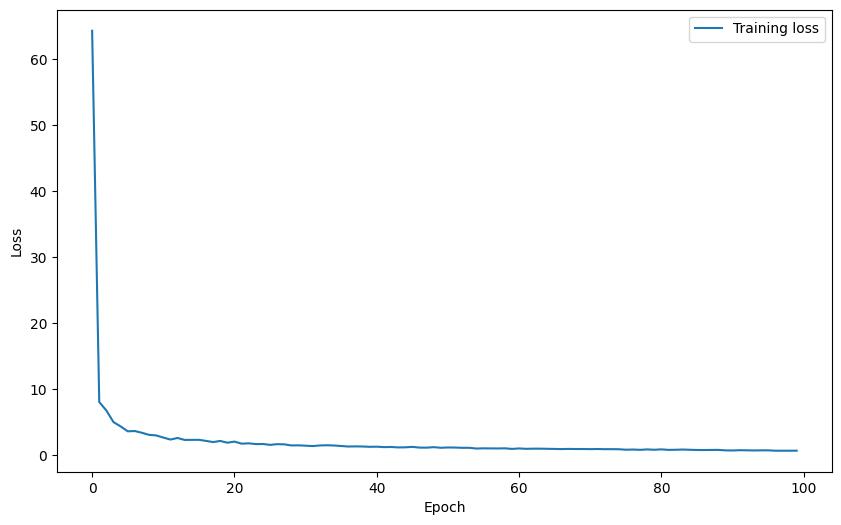

In [159]:
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Training loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')

## Ploting the training accuracy

Text(0, 0.5, 'Accuracy')

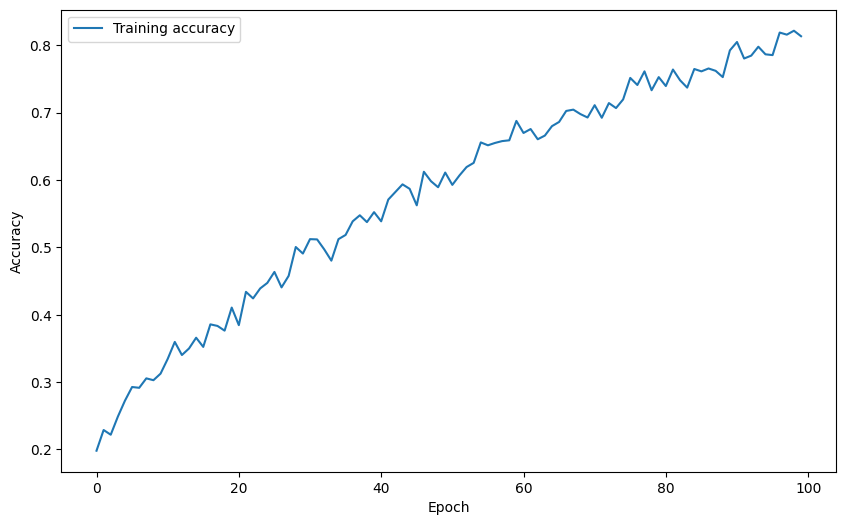

In [160]:
plt.figure(figsize=(10, 6))
plt.plot(train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

## Evaluate the model on the test data

In [161]:
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

35/35 [==============================] - 0s 3ms/step - loss: 2.6039 - accuracy: 0.3070
Test loss: 2.6038906574249268
Test accuracy: 0.30699363350868225
